# Set up

In [1]:
import scyan as sy
import os
import glob
import anndata
import re
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import scanpy as sc
import scanpy.external as sce


/home/jupyter/envs/libs/scyan/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0


In [2]:
print(sy.__version__)


1.5.1


In [4]:
# define the working path
panel = "PT1"
data_path='/home/jupyter/projects/pre-ra/flow/raw-data/' + panel + '/labelled-expr/cache/'
fig_path = '/home/jupyter/projects/pre-ra/flow/02-clustering/results/' + panel +"/"
proj_name = 'pre-ra_flow_clustering_' + panel
output_path = '/home/jupyter/projects/pre-ra/flow/02-clustering/data/' +panel +'/'

if not os.path.exists(fig_path):
    os.makedirs(fig_path)
    
if not os.path.exists(output_path):
    os.makedirs(output_path)
    
# define scanpy verbose levels
sc.settings.verbosity = 3
sc.settings.figdir = fig_path
sc.settings.n_jobs = -1

# Helper Functions 

In [5]:
# make a function to find files
def get_filepaths_with_glob(root_path: str, file_regex: str):
    return glob.glob(os.path.join(root_path, file_regex))


def subset_files(file_names, substrings):
    # Initialize an empty list to store the matching file names
    matching_files = []

    # Iterate through each file name
    for file_name in file_names:
        # Check if any substring is present in the file name
        if any(substring in file_name for substring in substrings):
            # If yes, add the file name to the matching list
            matching_files.append(file_name)

    return matching_files

In [6]:
# load data from csv
def read_one(file_path):
    #print(file_path)
    adata = sy.read_csv(file_path, marker_regex='^cd|^hla|tcr|ig|^ccr|klrg',  exclude_markers=None)
    adata.obs["batch"] = re.findall( 'B\\d\\d\\d', file_path)[0]
    adata.obs["panel"] = re.findall( 'PB1|PT1|PM1|PS1', file_path)[0]

    return adata


In [7]:
# Function to check if any substring is present in the file name
def contains_substring(file_name, substrings):
    return any(substring in file_name for substring in substrings)

In [8]:
### UMAP helper plot, define a helper function to set a single column for our UMAP figure legends. 
def one_col_lgd(umap):
    legend = umap.legend(bbox_to_anchor=[1.00, 0.5],
    loc='center left', ncol=1, prop={'size': 6})
    legend.get_frame().set_linewidth(0.0)
    for handle in legend.legendHandles:
        handle.set_sizes([25.0])
    return legend

# Load files

In [9]:
flow_files=get_filepaths_with_glob(data_path, '*/*transform_labelled_expr.csv')


In [10]:
### read in meta data and pull only non duplicate samples to anndata

freq_tbl = pd.read_csv('/home/jupyter/projects/pre-ra/flow/01-qc-reports/data/' + panel+ '/freq_tbl_sample_info_' + panel + '.csv')

In [12]:
# subset flow files based on non duplicate files in meta data
strings = freq_tbl['sample_id'].unique()

# Subset file_names based on matching substrings
matching_files = [file_name for file_name in flow_files if contains_substring(file_name, strings)]

# Print the result
len(matching_files)
len(strings)

144

In [13]:
flow_files[:5]

['/home/jupyter/projects/pre-ra/flow/raw-data/PT1/labelled-expr/cache/3c5b818e-00f6-445e-af87-242581b4dcb9/B022_PT1_PB00056-02_live_logical_transform_labelled_expr.csv',
 '/home/jupyter/projects/pre-ra/flow/raw-data/PT1/labelled-expr/cache/895e9630-dc5e-47f3-9202-831a1f41fb36/B182_PT1_PB02292-002_live_logical_transform_labelled_expr.csv',
 '/home/jupyter/projects/pre-ra/flow/raw-data/PT1/labelled-expr/cache/20480902-1cd5-489c-a805-da7270d18382/B088_PT1_PB02139-01_live_logical_transform_labelled_expr.csv',
 '/home/jupyter/projects/pre-ra/flow/raw-data/PT1/labelled-expr/cache/878d8c52-9ce2-4851-b613-823c76da7b57/B140_PT1_PB00065-02_live_logical_transform_labelled_expr.csv',
 '/home/jupyter/projects/pre-ra/flow/raw-data/PT1/labelled-expr/cache/849df711-2dbf-42e8-9596-012c7c252478/B143_PT1_PB02975-001_live_logical_transform_labelled_expr.csv']

In [14]:

adata = anndata.concat([read_one(p) for p in matching_files], index_unique="-")

In [15]:
len(adata.obs['sample_id'].unique())

143

## Merge L1 pop

In [16]:
labels_df = freq_tbl[["labels", "l1_labels"]].drop_duplicates()

In [17]:
adata.obs = adata.obs.join(labels_df.set_index('labels'), on='labels')

In [18]:
adata.obs['l1_labels'].unique()

array(['total_t_cells', 'total_nk_cells', 'unknown', 'b_cells', 'debris',
       'myeloid_cells', 'Other cells'], dtype=object)

In [19]:
adata

AnnData object with n_obs × n_vars = 54669798 × 25
    obs: 'Unnamed: 0', 'sample_id', 'cell_id', 'barcode', 'Time', 'SSC-W', 'SSC-H', 'SSC-A', 'FSC-W', 'FSC-H', 'FSC-A', 'SSC-B-W', 'SSC-B-H', 'SSC-B-A', 'Viability_logicle', 'labels', 'batch', 'panel', 'l1_labels'

In [ ]:
# save unscaled adata for subsetting -- do not run
#adata.write_h5ad(output_path + "adata_preprocess_unscaled_" + panel + ".h5ad")

# PCA

In [20]:
# adata = sc.read_h5ad(output_path + "adata_preprocess_unscaled_" + panel + ".h5ad")

In [21]:
# Important: data from the Cyanno pipeline are already logcile tranformed. 
# No need to redo the transformation
adata.X


array([[3.007658  , 3.7633972 , 1.4020809 , ..., 1.422128  , 1.7452158 ,
        1.4027047 ],
       [3.3836913 , 3.8121603 , 1.0198884 , ..., 1.1390989 , 0.87606704,
        1.0691113 ],
       [1.2452149 , 3.6283948 , 2.686116  , ..., 1.119973  , 1.1897376 ,
        2.5487187 ],
       ...,
       [2.7057395 , 3.723501  , 1.3235974 , ..., 1.4827846 , 1.6912792 ,
        2.3166966 ],
       [2.667234  , 3.731437  , 3.0949419 , ..., 2.6726906 , 0.7999222 ,
        2.5119092 ],
       [1.3110902 , 3.4483302 , 1.6372234 , ..., 1.5762573 , 1.2228914 ,
        1.6009688 ]], dtype=float32)

In [22]:
## check for NAs in exp array, PM1 has NAns
np.isnan((np.sum(adata.X)))

False

In [23]:
# use this next time
#sub_adata.layers['scaled'] = sc.pp.scale(sub_adata, copy=True).X

sy.preprocess.scale(adata)


[INFO] (scyan.preprocess) Data will be centered and standardised. This is advised only when using spectral/flow data (if this is not your case, consider running 'asinh_transform' instead of 'auto_logicle_transform').


In [24]:
adata.X

array([[ 0.8202988 ,  0.07971065, -0.37768385, ...,  0.03002429,
         0.72824043, -0.28425547],
       [ 1.2923981 ,  0.25075206, -1.1304199 , ..., -0.8868741 ,
        -1.4161651 , -0.8858623 ],
       [-1.3923994 , -0.39382413,  2.15125   , ..., -0.94883424,
        -0.64226216,  1.7824817 ],
       ...,
       [ 0.4412485 , -0.06022957, -0.5322586 , ...,  0.22652705,
         0.5951655 ,  1.36405   ],
       [ 0.39290586, -0.03239322,  2.9564407 , ...,  4.0813355 ,
        -1.6040334 ,  1.716099  ],
       [-1.3096948 , -1.0254196 ,  0.08543409, ...,  0.5293404 ,
        -0.56046325,  0.07329674]], dtype=float32)

In [25]:
# load panel info for pt1
panel_df = pd.read_csv('/home/jupyter/projects/pre-ra/flow/raw-data/AIFI_flow_' + panel + '_panel_breakdown.csv')
gating_antigens = panel_df.loc[panel_df['used_for_clustering']=='Yes', 'antigen']

gating_antigens = [s + '_logicle' for s in gating_antigens]

In [26]:
gating_antigens

['CD3_logicle',
 'CD45_logicle',
 'CD56_logicle',
 'CD8_logicle',
 'CD103_logicle',
 'abTCR_logicle',
 'CD127 (IL7Ra)_logicle',
 'CD278 (ICOS)_logicle',
 'CD45RA_logicle',
 'CD185 (CXCR5)_logicle',
 'CD4_logicle',
 'HLA-DR_logicle',
 'CD279 (PD-1)_logicle',
 'TIGIT_logicle',
 'CD38_logicle',
 'CD197 (CCR7)_logicle',
 'CD25 (IL2Ra)_logicle',
 'KLRG1_logicle']

In [27]:
len(gating_antigens)


18

In [28]:
sy.tools.umap(adata, markers=gating_antigens)


[INFO] (scyan.tools.representation) Fitting UMAP...


UMAP(min_dist=0.5, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

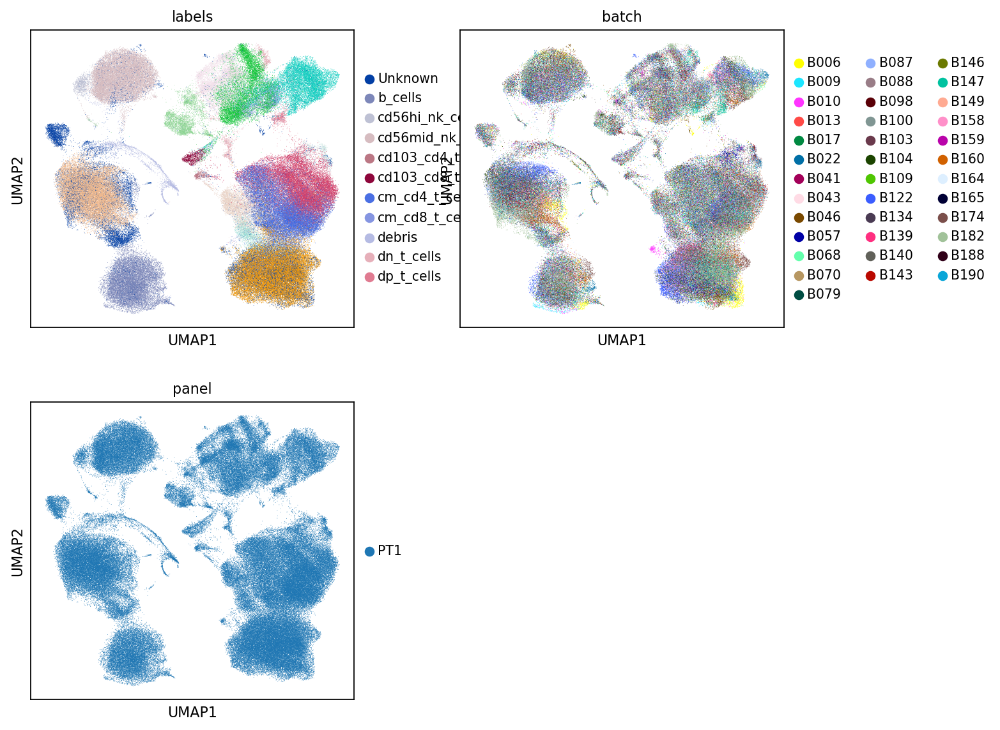

In [29]:
p1=sy.plot.umap(adata, color=['labels', 'batch','panel'],return_fig=True, ncols =2)
p1.savefig(fig_path + "umap_labels_batch_uncorrected_pabel_" +panel + ".png")

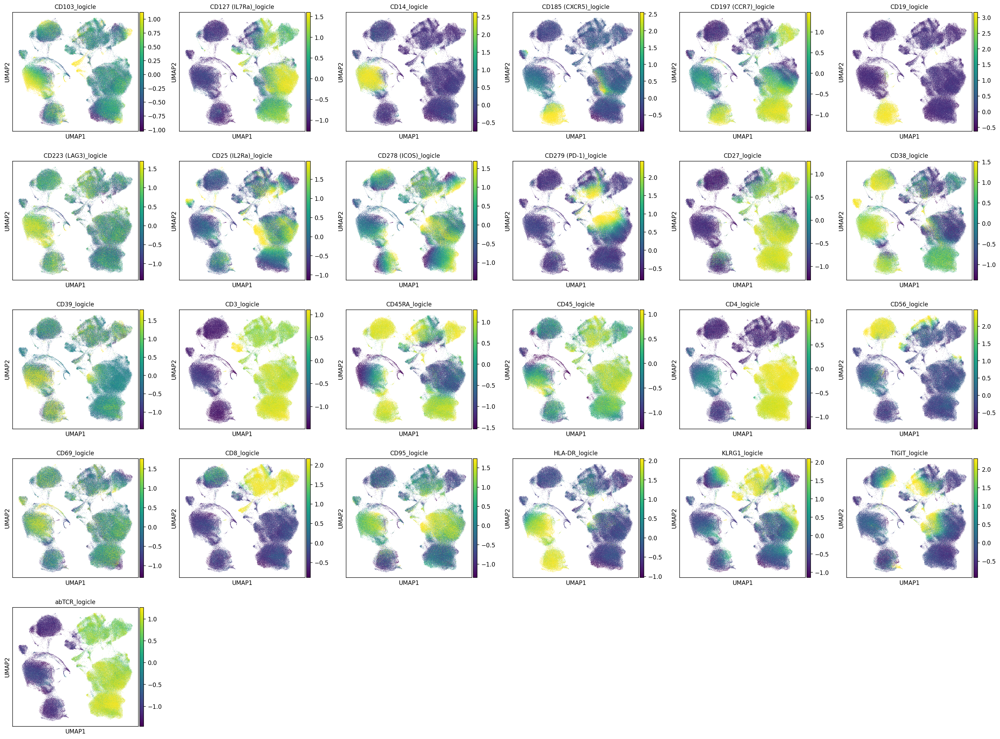

In [30]:
p1=sy.plot.umap(adata, color=adata.var_names.sort_values(),
             ncols=6, show=True, return_fig=True)
p1.set_size_inches(18.5, 18.5)
p1.savefig(fig_path + "umap_expression_labels_batch_uncorrected_panel_" +panel + ".png")

In [31]:
# set up the variable
adata.var['antigens'] = adata.var.index.str.replace('_logicle', '')
adata.var[['gating_antigens']] = False
adata.var.loc[adata.var.index.isin(gating_antigens),'gating_antigens'] = True
adata.var[['highly_variable']] = adata.var[['gating_antigens']]
adata.var

,antigens,gating_antigens,highly_variable
CD3_logicle,CD3,True,True
CD45_logicle,CD45,True,True
CD56_logicle,CD56,True,True
CD19_logicle,CD19,False,False
CD27_logicle,CD27,False,False
CD8_logicle,CD8,True,True
CD39_logicle,CD39,False,False
CD103_logicle,CD103,True,True
abTCR_logicle,abTCR,True,True
CD223 (LAG3)_logicle,CD223 (LAG3),False,False


In [32]:
adata.obsm['X_umap_uncorrected'] = adata.obsm['X_umap'].copy()


In [33]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
sc.pp.pca(adata, svd_solver="arpack", use_highly_variable=True)


computing PCA
    on highly variable genes
    with n_comps=17
    finished (0:00:29)


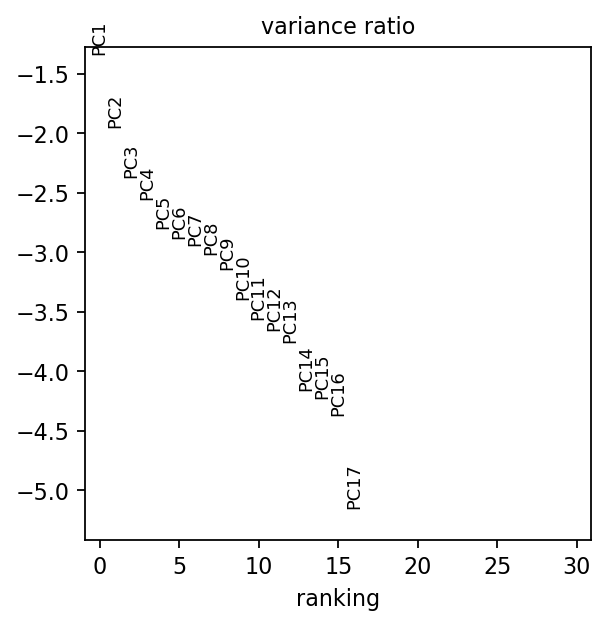

In [34]:
p1 = sc.pl.pca_variance_ratio(adata, log=True, save = "elblow_plot_variance_ratio_" +panel + ".png")

In [35]:
adata.write_h5ad(output_path + "adata_preprocess_" + panel + ".h5ad")

# Subset and recluster

In [36]:
adata = sc.read_h5ad(output_path + "adata_preprocess_" + panel + ".h5ad")

In [37]:
adata

AnnData object with n_obs × n_vars = 54669798 × 25
    obs: 'Unnamed: 0', 'sample_id', 'cell_id', 'barcode', 'Time', 'SSC-W', 'SSC-H', 'SSC-A', 'FSC-W', 'FSC-H', 'FSC-A', 'SSC-B-W', 'SSC-B-H', 'SSC-B-A', 'Viability_logicle', 'labels', 'batch', 'panel', 'l1_labels'
    var: 'antigens', 'gating_antigens', 'highly_variable'
    uns: 'pca', 'scyan_scaling_means', 'scyan_scaling_stds'
    obsm: 'X_pca', 'X_umap', 'X_umap_uncorrected'
    varm: 'PCs'

In [38]:
# observe l1 subpopulation by mergin
cell_labels_to_subset_list = adata.obs['l1_labels'].unique()

In [43]:
adata.obs

,Unnamed: 0,sample_id,cell_id,barcode,Time,SSC-W,SSC-H,SSC-A,FSC-W,FSC-H,FSC-A,SSC-B-W,SSC-B-H,SSC-B-A,Viability_logicle,labels,batch,panel,l1_labels
0-0,0,PB00056-02,1,40af277033d811eda6b6f66977b44e60,48836.0,694980.4375,286771.0,332167.06250,655828.5625,967844.0,1057899.625,668850.1875,373175.0,415996.93750,1.364889,naive_cd4_t_cells,B022,PT1,total_t_cells
1-0,1,PB00056-02,2,40af27ca33d811eda6b6f66977b44e60,48838.0,758116.4375,426322.0,538669.50000,715431.6875,695622.0,829450.000,707075.5625,439490.0,517921.06250,1.711495,naive_cd4_t_cells,B022,PT1,total_t_cells
2-0,2,PB00056-02,3,40af280633d811eda6b6f66977b44e60,48840.0,717803.0625,684764.0,819209.50000,728476.6250,1179720.0,1432330.750,689576.1875,720088.0,827592.56250,1.711632,cd56mid_nk_cells,B022,PT1,total_nk_cells
3-0,3,PB00056-02,4,40af285633d811eda6b6f66977b44e60,48848.0,800040.1250,501484.0,668678.87500,724528.3750,1425495.0,1721352.625,754406.8125,620545.0,780239.00000,1.702691,em_cd4_t_cells,B022,PT1,total_t_cells
4-0,4,PB00056-02,5,40af28ba33d811eda6b6f66977b44e60,48850.0,732305.1250,559245.0,682563.31250,716273.1250,1404149.0,1676257.000,696904.5625,755637.0,877678.12500,1.369074,cm_cd4_t_cells,B022,PT1,total_t_cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197-179,517197,PB04105-00,599819,ea2d3fc84e8d11eebad44a30fa3d3dec,1466499.0,655958.3125,549942.0,601231.68750,676748.7500,1047097.0,1181036.000,632491.1875,544573.0,574062.75000,1.398981,memory_treg,B140,PT1,total_t_cells
517198-179,517198,PB04105-00,599820,ea2d400e4e8d11eebad44a30fa3d3dec,1466501.0,655110.7500,639322.0,698044.50000,702563.4375,1456931.0,1705977.375,655260.9375,501728.0,547937.93750,1.652746,cm_cd4_t_cells,B140,PT1,total_t_cells
517199-179,517199,PB04105-00,599821,ea2d404a4e8d11eebad44a30fa3d3dec,1466502.0,669153.6875,454457.0,506835.96875,718724.3750,1286256.0,1540772.500,631230.3125,464940.0,489140.34375,1.684171,cm_cd4_t_cells,B140,PT1,total_t_cells
517200-179,517200,PB04105-00,599823,ea2d40f44e8d11eebad44a30fa3d3dec,1466504.0,634851.5000,594353.0,628876.43750,655905.1875,966227.0,1056255.500,607634.0000,547766.0,554735.43750,1.519080,em_cd8_t_cells,B140,PT1,total_t_cells


In [45]:
pd.crosstab(adata.obs['l1_labels'], adata.obs['panel'], margins=True)

panel,PT1,All
l1_labels,,
Other cells,38268,38268
b_cells,4057472,4057472
debris,779513,779513
myeloid_cells,6060299,6060299
total_nk_cells,5333506,5333506
total_t_cells,32140287,32140287
unknown,6260453,6260453
All,54669798,54669798


In [ ]:
cell_labels_to_subset_list[0]

['total_nk_cells']
Categories (1, object): ['total_nk_cells']
computing PCA
    on highly variable genes
    with n_comps=17
    finished (0:00:12)


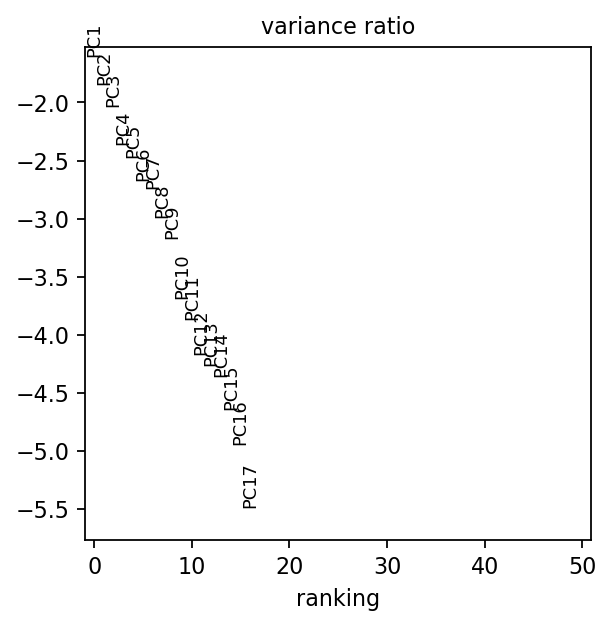

2024-01-09 19:30:35,015 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-09 19:45:49,101 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-09 19:46:09,408 - harmonypy - INFO - Iteration 1 of 10
2024-01-09 20:19:49,696 - harmonypy - INFO - Iteration 2 of 10
2024-01-09 21:27:41,737 - harmonypy - INFO - Iteration 4 of 10


In [ ]:
# Iterate through the list of cell labels
for cell_label in cell_labels_to_subset_list[[1]]:
    # Subset the Anndata object based on the current cell label
    sub_adata = adata[adata.obs['l1_labels'].isin([cell_label]), :]
    
    print(sub_adata.obs["l1_labels"].unique())
    
    # retransform rescale after subsetting
    #sy.preprocess.auto_logicle_transform(sub_adata)
    #sy.preprocess.scale(sub_adata)
    
    
    # setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
    sc.pp.pca(sub_adata, svd_solver="arpack", use_highly_variable=True)
    sc.pl.pca_variance_ratio(sub_adata, log=True, n_pcs=50, save='pca_var_' +cell_label+'.png') # scanpy generates the filename automatically
    
    # perform batch correction
    sce.pp.harmony_integrate(sub_adata, 'batch', adjusted_basis='X_pca_harmony')

    # replace new pca slot
    sub_adata.obsm['X_pca'] = sub_adata.obsm['X_pca_harmony']

    # Perform re-clustering on the subset
    sc.pp.neighbors(sub_adata, n_neighbors=20, n_pcs=15, use_rep='X_pca_harmony')
    sc.tl.leiden(sub_adata, resolution=0.5)
    
    # Visualize or perform further analysis on the re-clustered subset
    # (e.g., UMAP, Louvain clustering, etc.)
    #sc.tl.umap(sub_adata, obsm='X_pca_harmony')
    sy.tools.umap(sub_adata, obsm='X_pca_harmony')
    
    p1=sy.plot.umap(sub_adata, color=['l1_labels','labels', 'batch','panel'], ncols =2, return_fig = True)
    p1.savefig(fig_path + cell_label + "_umap_labels_batch_panel_" +panel + ".png",
               dpi=400, bbox_inches='tight')
    
    leiden_umap = sc.pl.umap(sub_adata, color=['leiden'],show=False,
                             legend_fontsize=6, frameon=True, title='Leiden')
    leiden_umap = leiden_umap.get_figure()
    leiden_umap.set_size_inches(5, 5)
    leiden_umap.savefig(fig_path + cell_label + "_umap_leiden_clusters_" +panel + ".png",
                       dpi=400, bbox_inches='tight')
    
    marker_umap =sy.plot.umap(sub_adata, color=adata.var_names.sort_values(),
             ncols=6, show=True, return_fig=True)
    marker_umap.set_size_inches(18.5, 18.5)
    marker_umap.savefig(fig_path + cell_label + "_umap_expression_labels_corrected_panel_" +panel + ".png")
    
    # save 
    sub_adata.write_h5ad(output_path + cell_label + "_adata_subset_clustered_" + panel + ".h5ad")



# Run Harmonyunique

In [ ]:
adata = sc.read_h5ad(output_path + "adata_preprocess_" + panel + ".h5ad")

In [ ]:
adata

In [ ]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=17)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)

In [ ]:
# run harmony
sce.pp.harmony_integrate(adata, 'batch', adjusted_basis='X_pca_harmony')

In [ ]:
adata